In [1]:
# load pretrain model which name is object_detection_model.pth that i saved in model directory
import os
import torch
from tqdm import tqdm
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches


In [2]:
def get_detection_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

model = get_detection_model(13)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
model.to(device)

Using device: cuda


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [3]:
checkpoint = torch.load('/ExDark-Object-Detection/models/BM3D_GAN_Faster_RCNN.pth')
model.load_state_dict(checkpoint)


<All keys matched successfully>

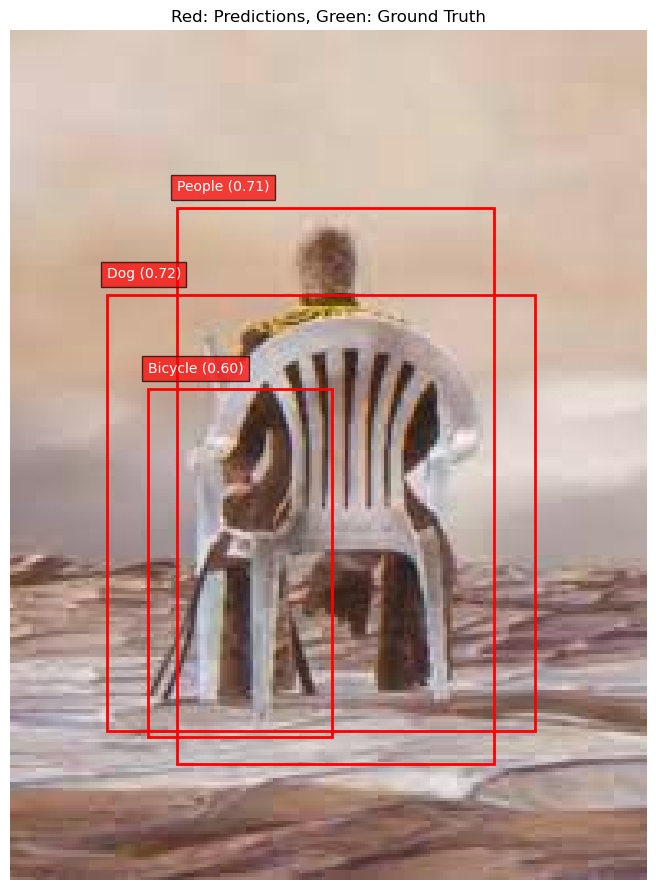

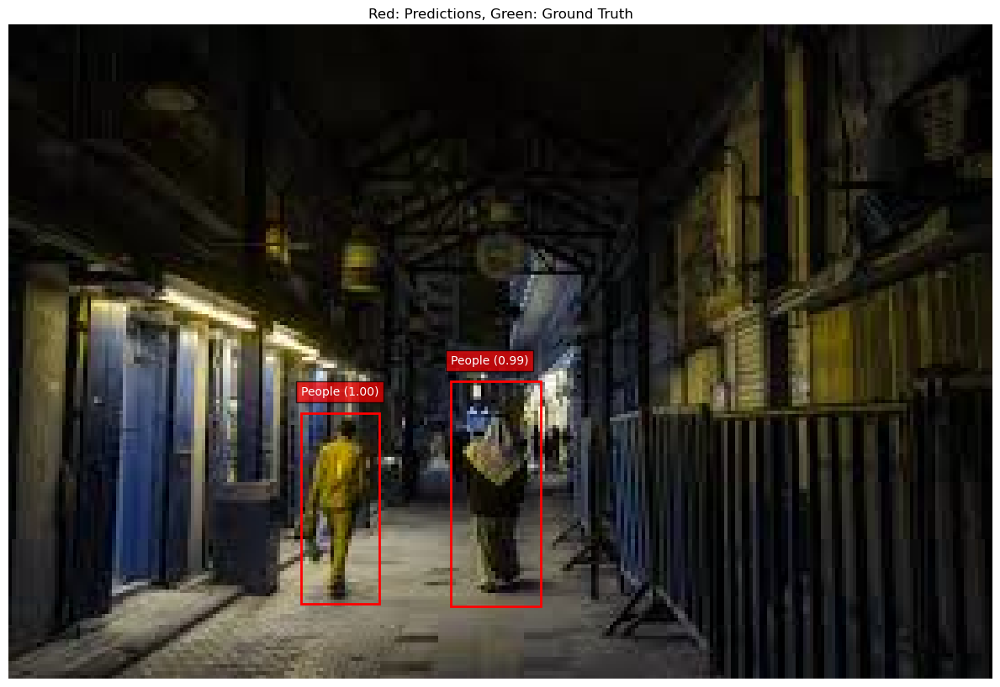

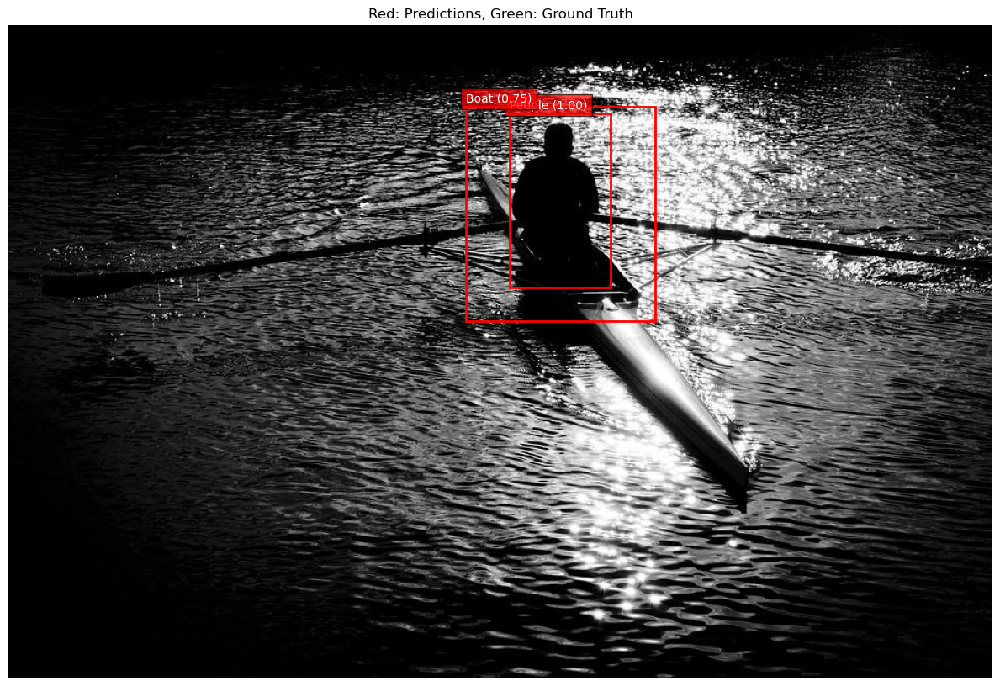

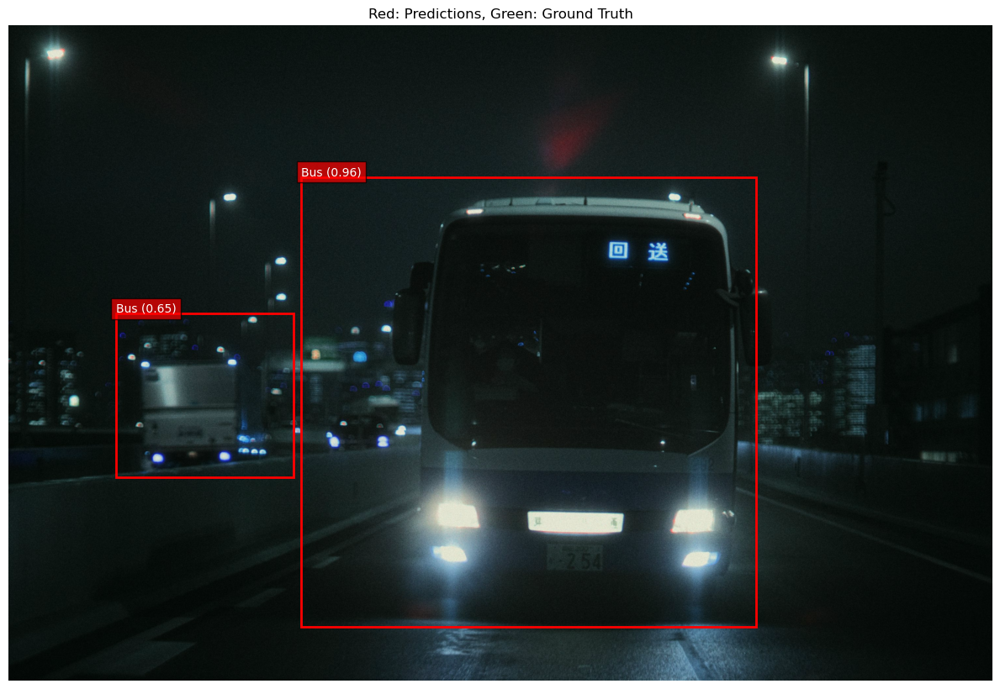

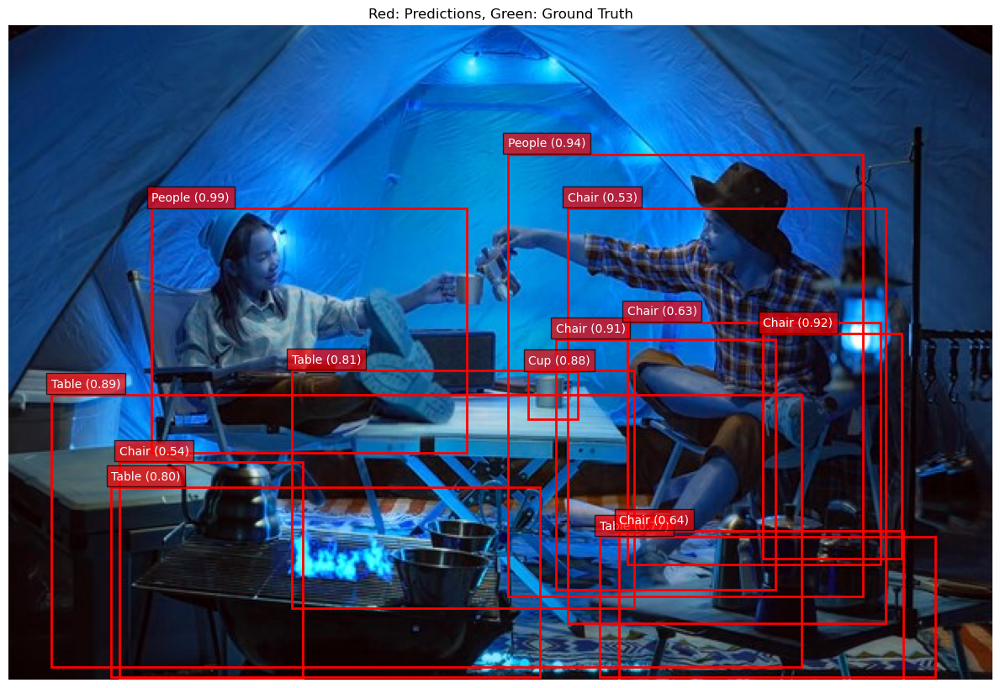

...

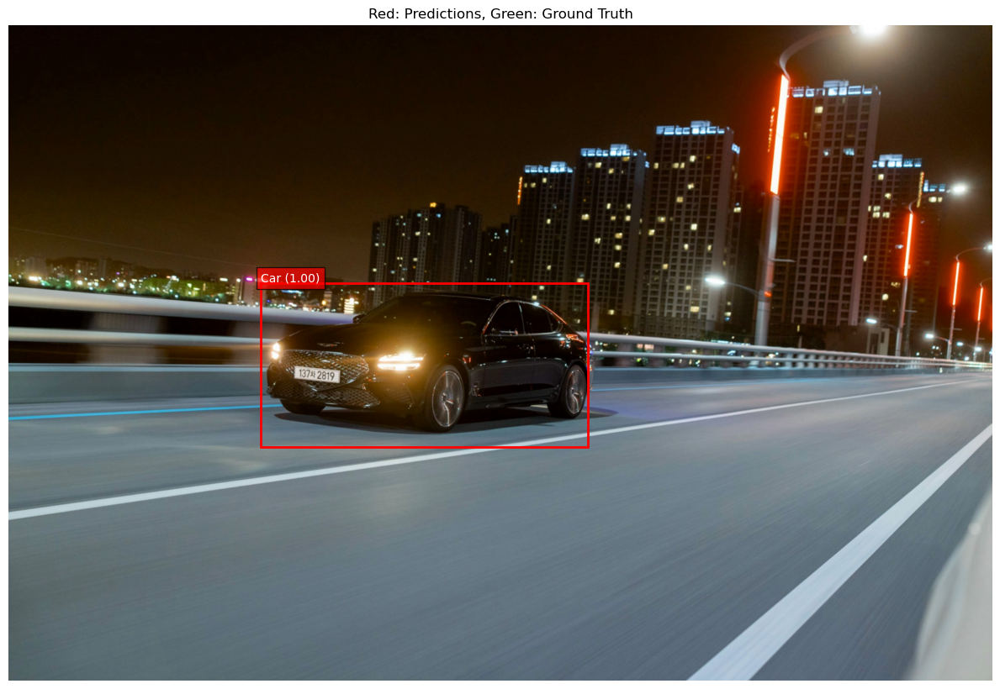

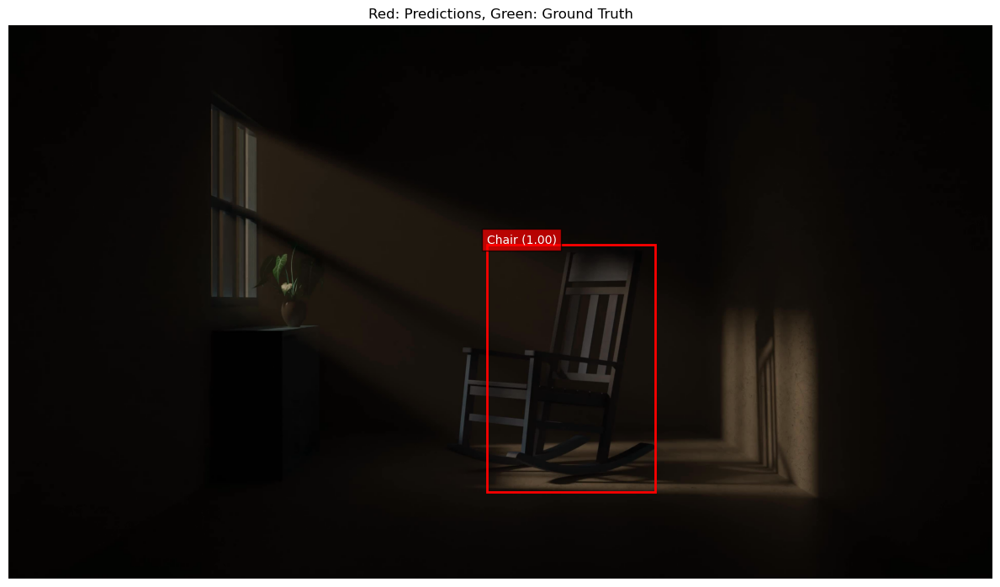

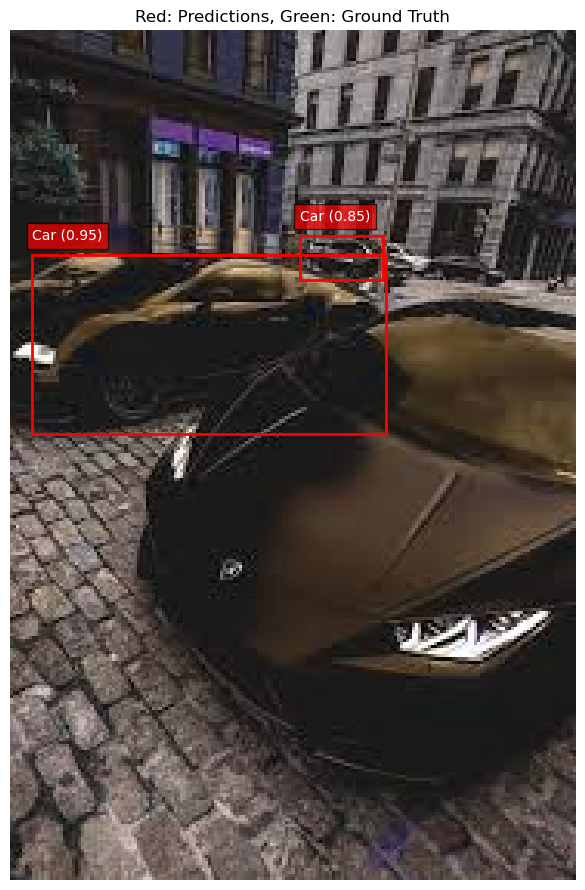

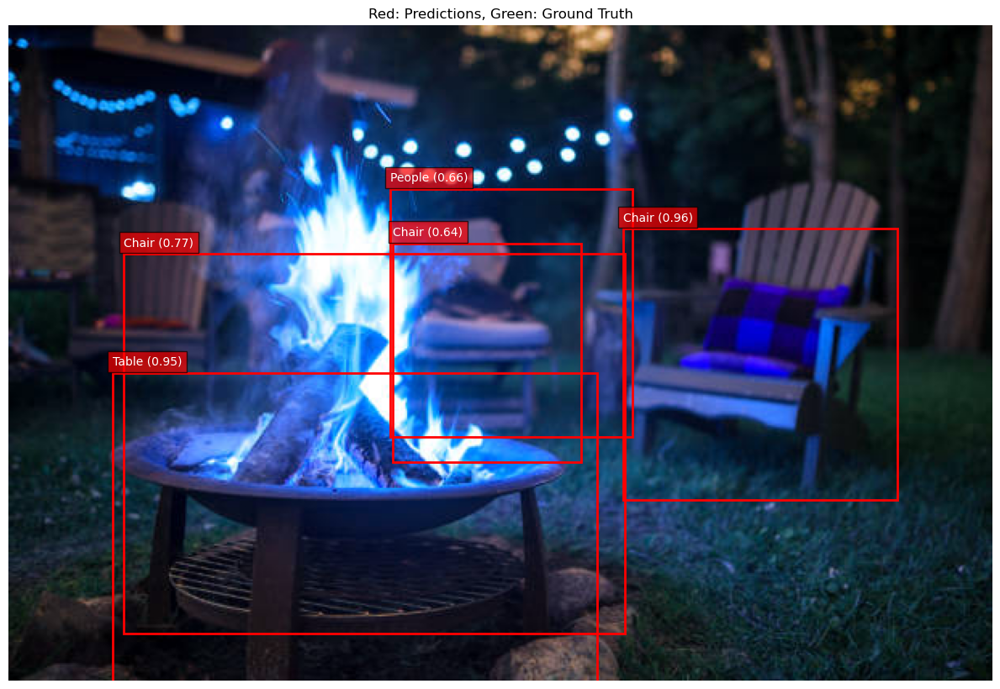

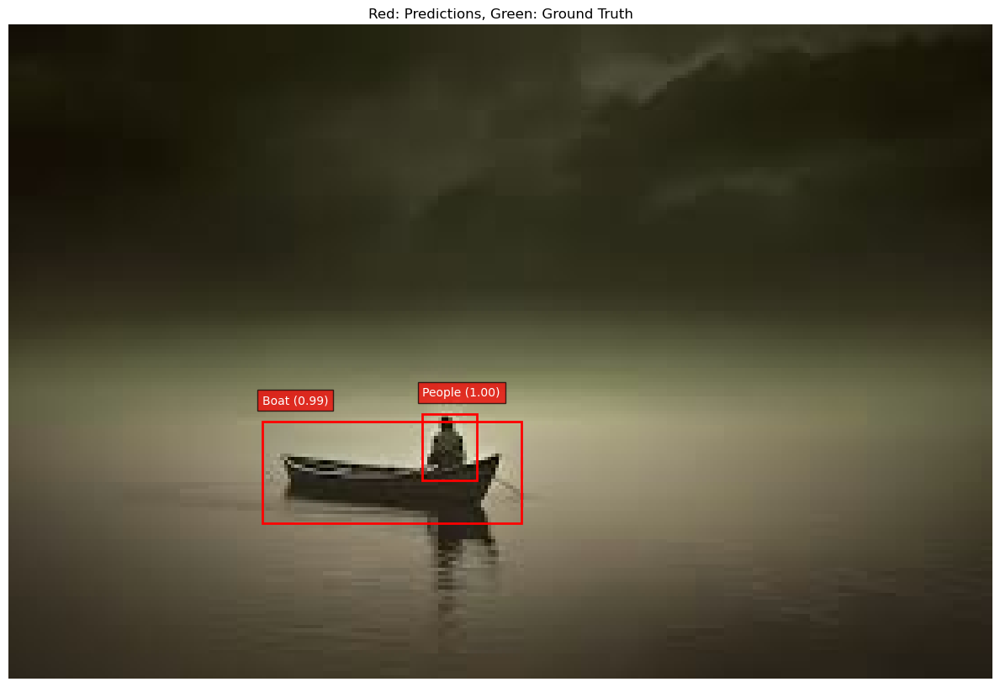

In [4]:
# Hàm hiển thị kết quả prediction
def show_prediction(model, image_name, image, target=None, idx2label=None, confidence_threshold=0.6):
    model.eval()
    with torch.no_grad():
        prediction = model([image.to(device)])[0]
        
    # Chuyển đổi bounding boxes về numpy để dễ vẽ
    boxes = prediction['boxes'].cpu().numpy()
    labels = prediction['labels'].cpu().numpy()
    scores = prediction['scores'].cpu().numpy()
    
    fig, ax = plt.subplots(1, figsize=(12, 9))
    
    # Chuyển đổi image tensor về format để hiển thị
    if image.shape[0] == 3:  # CHW format
        img_display = image.permute(1, 2, 0).cpu().numpy()
    else:  # HWC format
        img_display = image.cpu().numpy()
    
    # Đảm bảo pixel values trong range [0, 1]
    if img_display.max() > 1.0:
        img_display = img_display / 255.0
    
    ax.imshow(img_display)
    
    # Vẽ prediction boxes (màu đỏ)
    for box, label, score in zip(boxes, labels, scores):
        if score < confidence_threshold:  # Chỉ vẽ nếu confidence > threshold
            continue
            
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2,
                                edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        
        # Hiển thị label và score
        if idx2label and label in idx2label:
            label_name = idx2label[label]
        else:
            label_name = f"Class_{label}"
            
        ax.text(xmin, ymin-5, f"{label_name} ({score:.2f})", 
                color='white', fontsize=10,
                bbox=dict(facecolor='red', alpha=0.7))
    
    # Vẽ ground truth boxes nếu có (màu xanh lá)
    if target is not None:
        gt_boxes = target['boxes'].cpu().numpy()
        gt_labels = target['labels'].cpu().numpy()
        
        for box, label in zip(gt_boxes, gt_labels):
            xmin, ymin, xmax, ymax = box
            width = xmax - xmin
            height = ymax - ymin
            
            rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2,
                                    edgecolor='g', facecolor='none', linestyle='--')
            ax.add_patch(rect)
            
            # Hiển thị ground truth label
            if idx2label and label in idx2label:
                label_name = idx2label[label]
            else:
                label_name = f"Class_{label}"
                
            ax.text(xmax, ymin-5, f"GT: {label_name}", 
                    color='white', fontsize=10,
                    bbox=dict(facecolor='green', alpha=0.7))
                
    ax.set_title("Red: Predictions, Green: Ground Truth")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    # Đảm bảo lưu ảnh đúng nội dung hiển thị
    fig.savefig(os.path.join('/ExDark-Object-Detection/output/GAN_BM3D', image_name))
    plt.close(fig)

def create_idx2label(label2idx):
    return {v: k for k, v in label2idx.items()}

# Sử dụng:
# Tạo mapping ngược từ index về tên class
label2idx = {'People': 1, 'Motorbike': 2, 'Car': 3, 'Bicycle': 4, 'Bus': 5, 'Bottle': 6, 'Chair': 7, 'Table': 8, 'Cup': 9, 'Dog': 10, 'Boat': 11, 'Cat': 12}
idx2label = create_idx2label(label2idx)

# Đường dẫn đến ảnh cần dự đoán
input_path = '/ExDark-Object-Detection/input'
for image_name in os.listdir(input_path):
    image_path = os.path.join(input_path, image_name)
    img = cv2.imread(image_path)
    show_prediction(model, image_name=image_name, image = torch.tensor(img).permute(2, 0, 1).float() / 255.0, idx2label=idx2label, confidence_threshold=0.5)
    